In [ ]:
!pip install nussl
!pip install demucs
!pip install asteroid

In [ ]:
import nussl
import matplotlib.pyplot as plt
import time
import warnings

In [ ]:
def visualize_and_embed(sources, y_axis='mel'):
    plt.figure(figsize=(10, 4))
    plt.subplot(111)
    nussl.utils.visualize_sources_as_masks(
        sources, db_cutoff=-60, y_axis=y_axis)
    plt.tight_layout()
    plt.show()
    nussl.play_utils.multitrack(sources, ext='.wav')

In [ ]:
# download the dataset
# this command downloads a 7 second clip of a each music and stem
musdb = nussl.datasets.MUSDB18(download=True)
audio_signal = musdb[3]['mix']

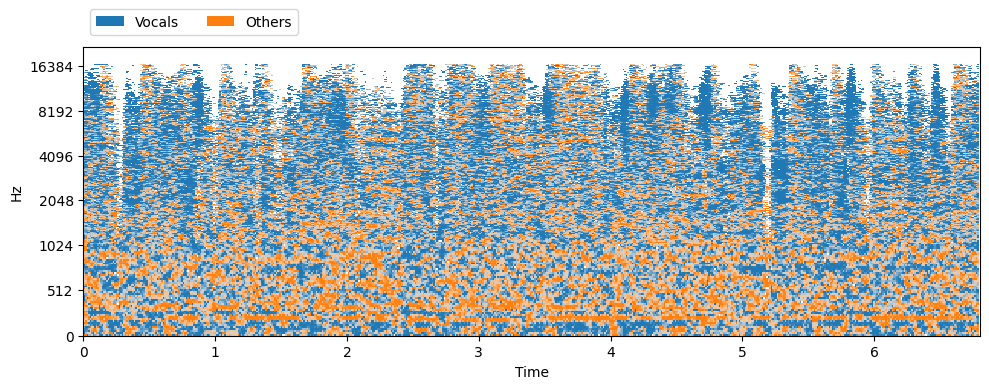


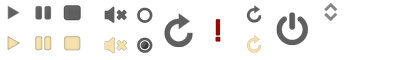
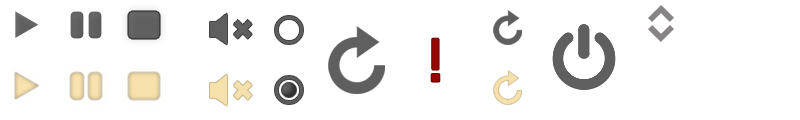
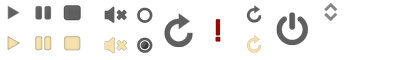

In [ ]:
separator = nussl.separation.spatial.Duet(
    audio_signal, num_sources=2)
estimates = separator()

estimates = {
    'Vocals': estimates[0],
    'Others': estimates[1]
}

visualize_and_embed(estimates)

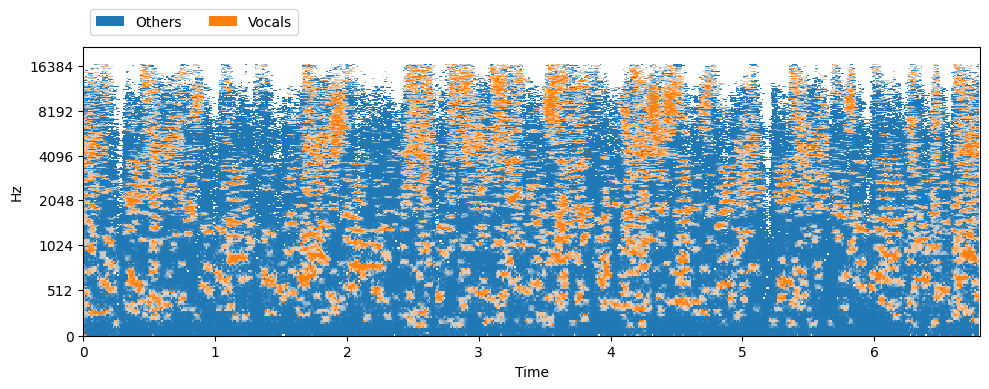


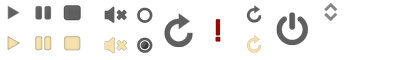
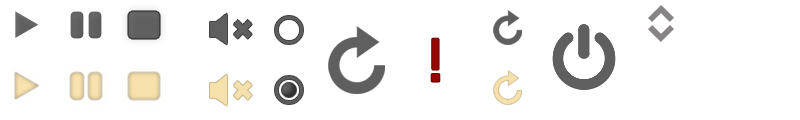
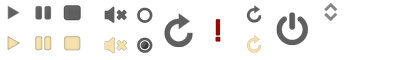

In [ ]:
ft2d = nussl.separation.primitive.FT2D(
    audio_signal, mask_type='binary')
estimates = ft2d()

estimates = {
    'Others': estimates[0],
    'Vocals': estimates[1]
}

visualize_and_embed(estimates)

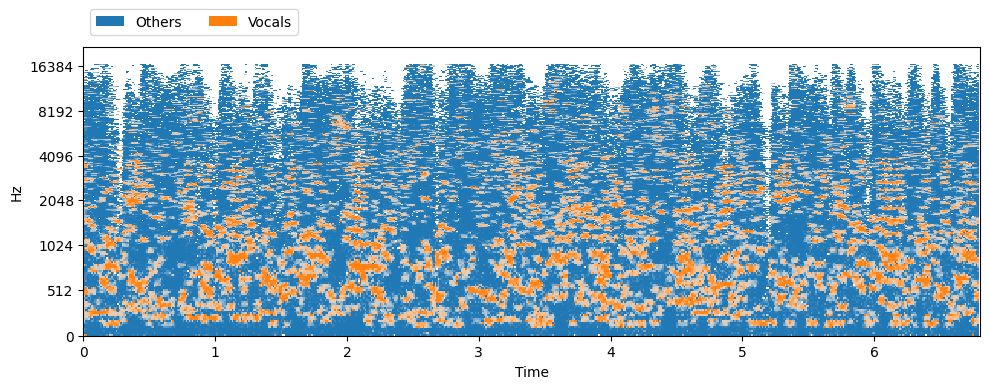


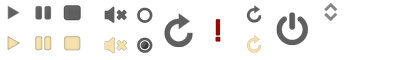
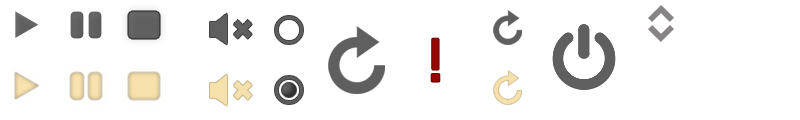
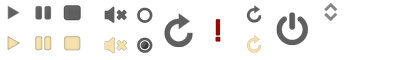

In [ ]:
separator = nussl.separation.factorization.RPCA(audio_signal)
estimates = separator()

estimates = {
    'Others': estimates[0],
    'Vocals': estimates[1]
}

visualize_and_embed(estimates)

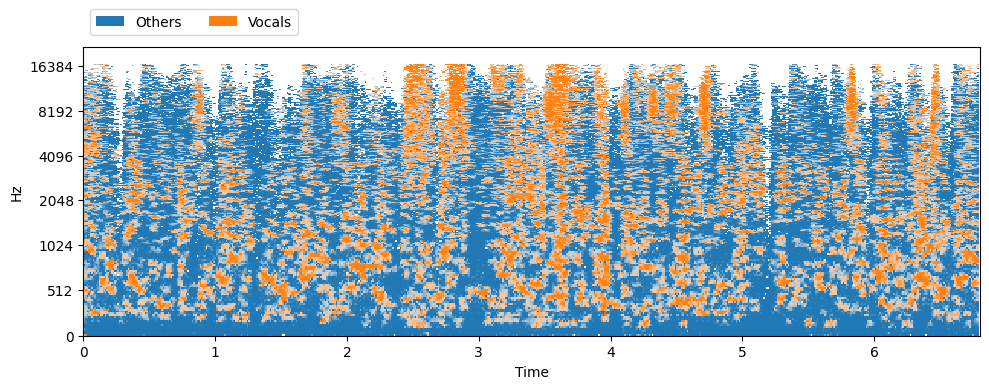


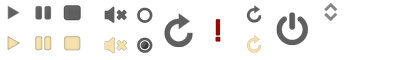
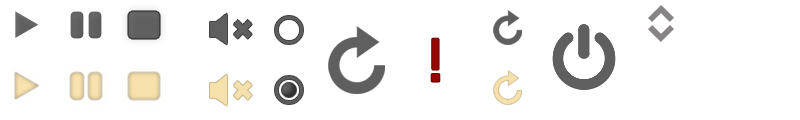
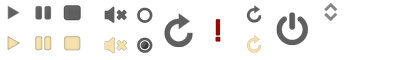

In [ ]:
separator = nussl.separation.primitive.Repet(
    audio_signal, mask_type='binary')
estimates = separator()

estimates = {
    'Others': estimates[0],
    'Vocals': estimates[1]
}

visualize_and_embed(estimates)


In [ ]:
!python -m demucs.separate /content/audio_example_mono1.mp3

Important: the default model was recently changed to `htdemucs` the latest Hybrid Transformer Demucs model. In some cases, this model can actually perform worse than previous models. To get back the old default model use `-n mdx_extra_q`.
Selected model is a bag of 1 models. You will see that many progress bars per track.
Separated tracks will be stored in /content/separated/htdemucs
Separating track /content/audio_example_mono1.mp3
100%|██████████████████████████████████████████████████████████████████████████| 11.7/11.7 [00:33<00:00,  2.89s/seconds]


In [ ]:
import os

def visualize_and_embed(audio_dir, y_axis='mel'):
    sources = {}
    for i, file_name in enumerate(os.listdir(audio_dir)):
        file_path = os.path.join(audio_dir, file_name)
        audio_signal = nussl.AudioSignal(file_path)
        sources[f'Source {i+1}'] = audio_signal
        
    plt.figure(figsize=(10, 4))
    plt.subplot(111)
    nussl.utils.visualize_sources_as_masks(
        sources, db_cutoff=-60, y_axis=y_axis)
    plt.tight_layout()
    plt.show()
    
    for source_name, audio_signal in sources.items():
        audio_signal.write_audio_to_file(f'{source_name}.wav')
    nussl.play_utils.multitrack(sources, ext='.wav')


In [ ]:
audio_dir = '/content/separated/htdemucs/audio_example_mono1'
visualize_and_embed(audio_dir)

In [ ]:
# Import the required libraries
import librosa
from spleeter.separator import Separator

# Load the mixed audio file
audio, sr = librosa.load('path/to/mixed/audio/file.wav', sr=44100)

# Create a Spleeter separator object
separator = Separator('spleeter:2stems')

# Separate the audio into vocals and accompaniment
separated_audio = separator.separate(audio)

# Get the vocals and accompaniment tracks
vocals = separated_audio['vocals']
accompaniment = separated_audio['accompaniment']

# Save the separated tracks to individual files
librosa.output.write_wav('path/to/output/vocals.wav', vocals, sr)
librosa.output.write_wav('path/to/output/accompaniment.wav', accompaniment, sr)